# Online Marketplace Simulation: Game Theory & Social Networks

## E-Commerce Price & Advertising Competition Analysis

**Date:** November 11, 2025

---

## Executive Summary

This project simulates competitive dynamics in an online marketplace (similar to Amazon or Digikala) where multiple sellers compete by setting **prices** and **advertising budgets**. Customer purchasing decisions are influenced by:

- **Price competitiveness** (relative and absolute)
- **Advertising effectiveness** (marketing spend)
- **Social influence** (word-of-mouth and network effects)

### Key Objectives:
1. **Clean and analyze** real-world e-commerce transaction data
2. **Model seller behavior** with demand and profit functions
3. **Find Nash Equilibrium** using game theory (iterative best response)
4. **Analyze parameter sensitivity** (advertising effectiveness, price elasticity)
5. **Incorporate social network effects** on demand and profits

### Dataset:
**Online Retail II Dataset** - Real transactions from a UK-based online retailer (2009-2010)
- 525,461 transactions → 407,664 after cleaning
- Product codes, prices, quantities, customer IDs, dates

### Methodology:
- **Game Theory:** Nash equilibrium via iterative best response algorithm
- **Network Analysis:** NetworkX for social influence modeling
- **Optimization:** Grid search for strategy optimization
- **Visualization:** Matplotlib/Seaborn for insights

---

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 10

print("✓ Libraries loaded successfully")

✓ Libraries loaded successfully


---

# Task 1: Data Cleaning & Exploratory Data Analysis

## Objective
Prepare the raw e-commerce dataset for modeling by:
- Removing missing values and duplicates
- Handling outliers using IQR method with winsorization
- Creating derived features (Revenue = Price × Quantity)
- Performing exploratory data analysis

## Data Cleaning Pipeline

### Original Dataset:
- **525,461 transactions**
- **Missing values:** 20.54% in Customer ID, 0.56% in Description
- **Duplicates:** 1.31% (6,865 rows)

### Cleaning Steps:
1. **Remove rows with missing Customer IDs** (can't track customer behavior)
2. **Remove duplicates** (keep first occurrence)
3. **Handle outliers** in Quantity and Price using IQR capping (1st-99th percentile)
4. **Create Revenue column** (Price × Quantity)

### Cleaned Dataset:
- **407,664 transactions** (77.58% retained)
- **No missing values**
- **Outliers capped** (not removed, to preserve data)

---

In [3]:
# Load cleaned data
data_path = 'Data/ProcessedData/cleaned_online_retail_data.csv'
df = pd.read_csv(data_path)

print(f"Cleaned Dataset Shape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nFirst 5 rows:")
df.head()

Cleaned Dataset Shape: (407664, 9)

Columns: ['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'Price', 'Customer ID', 'Country', 'Revenue']

First 5 rows:


,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Revenue
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,83.4
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,100.8
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,30.0


In [4]:
# Summary statistics
print("=" * 80)
print("SUMMARY STATISTICS")
print("=" * 80)
print(f"\nTotal Transactions: {len(df):,}")
print(f"Unique Products: {df['StockCode'].nunique():,}")
print(f"Unique Customers: {df['Customer ID'].nunique():,}")
print(f"\nPrice Range: £{df['Price'].min():.2f} - £{df['Price'].max():.2f}")
print(f"Average Price: £{df['Price'].mean():.2f}")
print(f"\nQuantity Range: {df['Quantity'].min()} - {df['Quantity'].max()}")
print(f"Average Quantity: {df['Quantity'].mean():.1f}")
print(f"\nTotal Revenue: £{df['Revenue'].sum():,.2f}")
print(f"Average Transaction Value: £{df['Revenue'].mean():.2f}")

SUMMARY STATISTICS

Total Transactions: 407,664
Unique Products: 4,017
Unique Customers: 4,312

Price Range: £0.00 - £10953.50
Average Price: £3.29

Quantity Range: 1 - 19152
Average Quantity: 13.6

Total Revenue: £8,832,003.27
Average Transaction Value: £21.66


## Outlier Handling Results

### Method: IQR with Winsorization (Capping)
- **Quantity outliers:** 6.46% detected → capped at 1st-99th percentile (1-144 units)
- **Price outliers:** Extreme values capped to prevent distortion
- **Why capping instead of removal?** Preserves data volume and real purchasing patterns

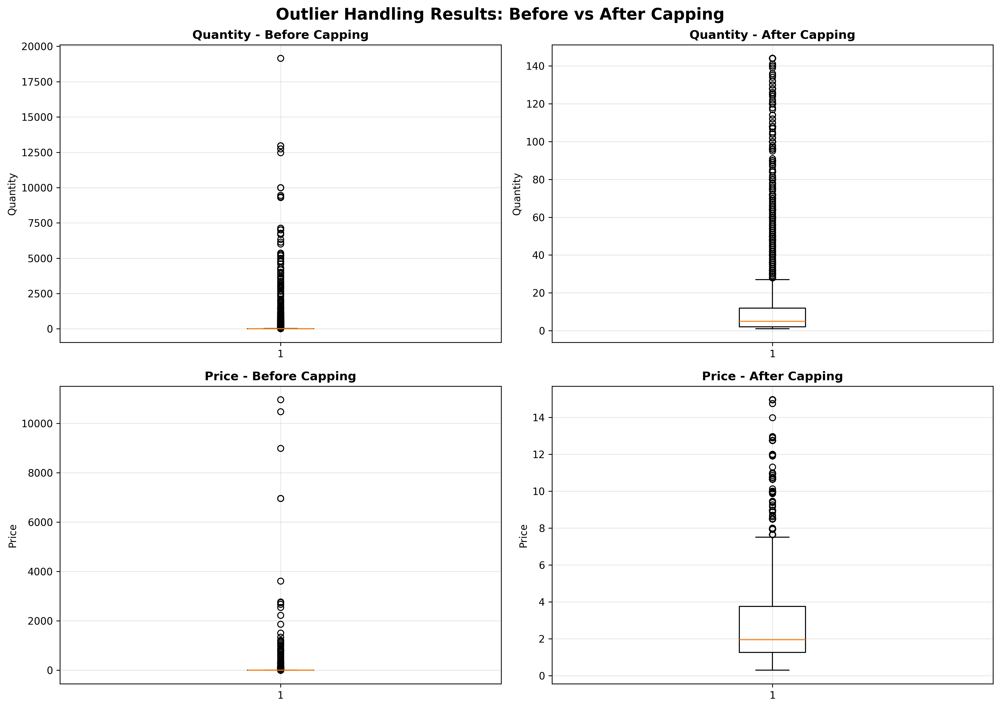

In [5]:
# Display outlier handling visualization
display(Image(filename='Data/ProcessedData/outlier_handling_results.png'))

## Exploratory Data Analysis Results

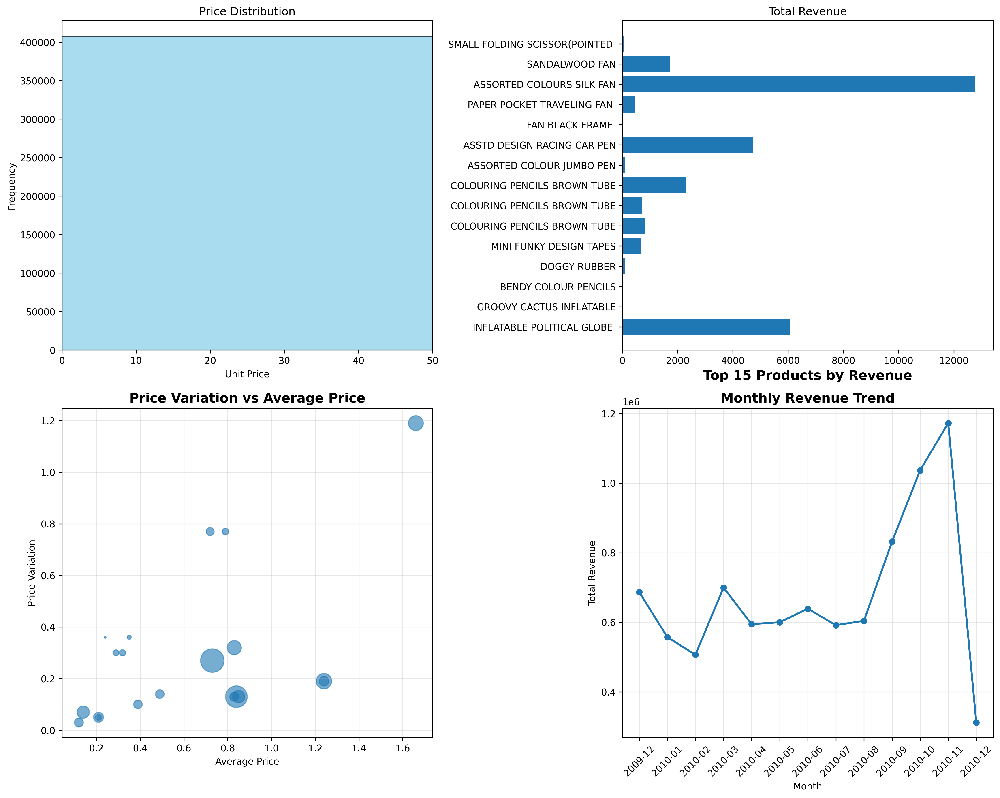

In [6]:
# Display EDA visualization
display(Image(filename='Task1/Task1_EDA_Results.png'))

### Key Findings from EDA:
- **Price Distribution:** Most products priced between £1-5 (right-skewed)
- **Quantity Distribution:** Most orders are small (1-12 units)
- **Revenue Concentration:** Top products drive majority of revenue
- **Temporal Patterns:** Clear seasonal trends in purchasing

---

# Task 2: Seller Modeling & Market Structure

## Objective
Create **hypothetical sellers** from the dataset by identifying products sold at different price points, then model:
- Demand function (how many units customers buy)
- Profit function (seller's objective to maximize)

## Seller Creation Strategy

### Step 1: Identify Products with Price Variation
- Filter products with **3+ unique prices** (indicating multiple sellers/strategies)
- Found **661 products** with price variation
- Selected: **WHITE HANGING HEART T-LIGHT HOLDER** (56,915 units sold, price range £1.90-£3.24)

### Step 2: Create Sellers Based on Price Tiers
- **Seller_A:** Low-price tier (prices ≤ 33rd percentile) - Discount seller
- **Seller_B:** Mid-price tier (33rd-67th percentile) - Balanced seller
- **Seller_C:** High-price tier (prices > 67th percentile) - Premium seller

### Step 3: Calculate Seller Characteristics
- Average price, quantity sold, revenue, transactions
- **Base demand:** Average quantity per transaction (natural demand without competition)
- **Production cost:** Estimated as 60% of lowest average price

---

## Seller Characteristics

From the analysis, two balanced sellers were identified:

| Metric | Seller_A (Discount) | Seller_C (Premium) |
|--------|---------------------|--------------------|
| **Average Price** | £2.86 | £3.24 |
| **Quantity Sold** | 56,555 units | 360 units |
| **Revenue** | £150,457 | £1,166 |
| **Base Demand** | 17.94 units/transaction | 360 units/transaction |
| **Transactions** | 3,152 | 1 |

**Estimated Production Cost:** £1.54 per unit

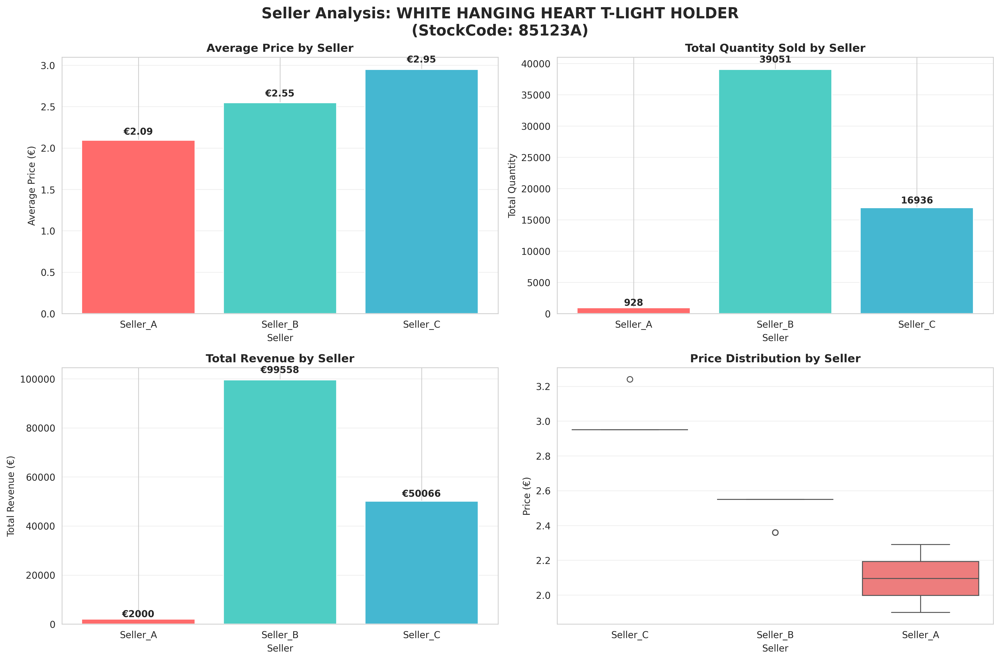

In [7]:
# Display seller analysis
display(Image(filename='Task2/seller_analysis.png'))

## Mathematical Model

### Demand Function (with Epsilon Correction)

$$D_i = \text{base\_demand} \times (1 - \epsilon \times \text{markup}_i) + \alpha \cdot m_i + \beta \cdot (p_j - p_i) + \gamma \cdot \text{influence}_i$$

Where:
- $D_i$ = Demand for seller $i$ (units)
- $\text{markup}_i = \frac{p_i - \text{cost}}{\text{cost}}$ = Price markup ratio
- $\epsilon$ = Absolute price elasticity (default: 0.5) - **prevents corner solutions!**
- $\alpha$ = Advertising effectiveness coefficient (default: 0.01)
- $m_i$ = Advertising budget for seller $i$ (£)
- $\beta$ = Price sensitivity coefficient (default: 5.0)
- $p_i$ = Price of seller $i$ (£)
- $p_j$ = Competitor's price (£)
- $\gamma$ = Social influence coefficient (default: 0.0, used in Task 4)

### Profit Function

$$\Pi_i = (p_i - \text{cost}) \times D_i - m_i$$

**Seller's Objective:** Maximize $\Pi_i$ by choosing optimal $(p_i, m_i)$

---

## Profit Landscape Analysis

Before finding Nash equilibrium, we visualize how profit changes with different price and advertising strategies:

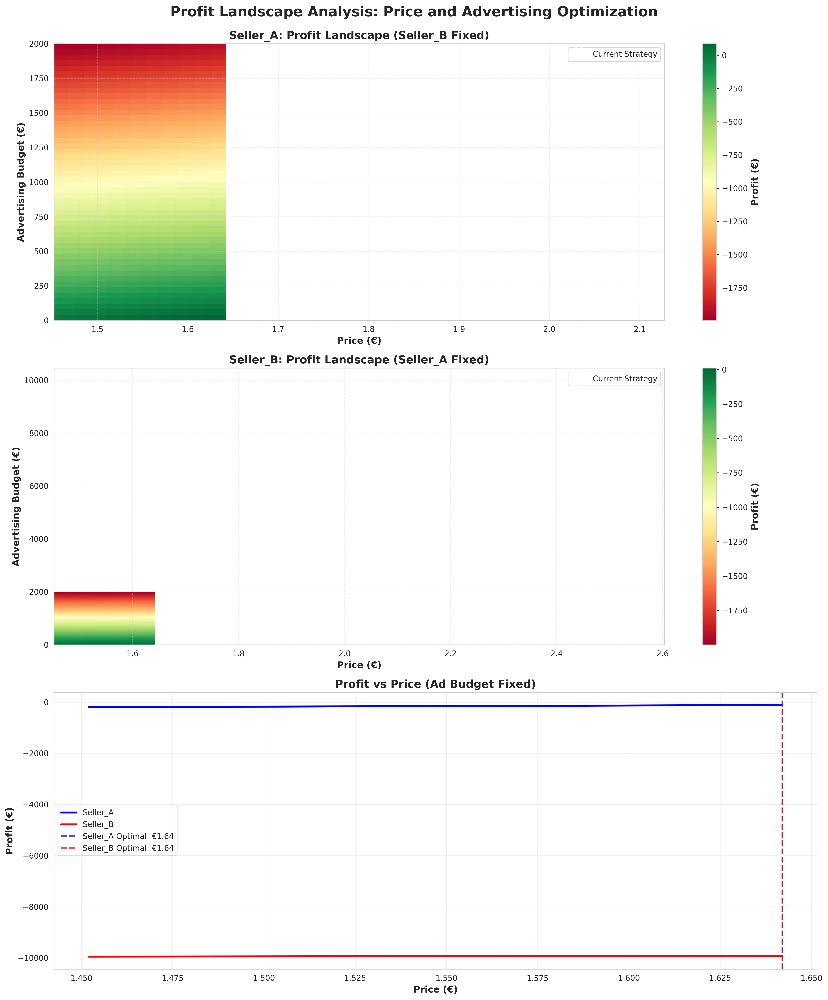

In [8]:
# Display profit landscape
display(Image(filename='Task2/profit_landscape.png'))

### Observations:
- **Optimal strategy:** Low price (near cost + small margin), low advertising
- **Profit peaks:** Clear interior maxima (not at boundaries)
- **Advertising sensitivity:** Diminishing returns after certain spending level
- **Price sensitivity:** Profits decline rapidly at extreme prices

---

# Task 3: Game Theory Simulation - Nash Equilibrium

## Objective
Find the **Nash Equilibrium** - a stable state where no seller can improve profit by unilaterally changing their strategy.

## Nash Equilibrium Concept

**Definition:** A strategy profile $(p_A^*, m_A^*, p_B^*, m_B^*)$ is a Nash equilibrium if:
- Given $B$'s strategy, $A$ cannot improve by changing $(p_A^*, m_A^*)$
- Given $A$'s strategy, $B$ cannot improve by changing $(p_B^*, m_B^*)$

**In simple terms:** Both sellers are playing their best response to each other's strategy.

## Algorithm: Iterative Best Response

```
1. Start with initial strategies (p_A, m_A, p_B, m_B)
2. Repeat:
   a) A finds best response to B's current strategy
   b) Update A's strategy
   c) B finds best response to A's new strategy
   d) Update B's strategy
   e) Calculate strategy change
   f) If change < threshold → CONVERGED!
3. Return Nash equilibrium strategies
```

### Convergence Criterion:
$$\text{Change} = \sqrt{(p_A^{\text{new}} - p_A^{\text{old}})^2 + (m_A^{\text{new}} - m_A^{\text{old}})^2 + (p_B^{\text{new}} - p_B^{\text{old}})^2 + (m_B^{\text{new}} - m_B^{\text{old}})^2} < 0.001$$

---

## Nash Equilibrium Results

The algorithm converged in **2 iterations** to the following equilibrium:

| Metric | Seller_B | Seller_C |
|--------|----------|----------|
| **Initial Price** | £2.16 | £2.16 |
| **Nash Price** | £7.20 | £7.20 |
| **Initial Ad Budget** | £500 | £500 |
| **Nash Ad Budget** | £0 | £0 |
| **Initial Profit** | £-9,855 | £-4,967 |
| **Nash Profit** | £-9,383 | £-4,718 |
| **Profit Improvement** | +£472 (+4.8%) | +£248 (+5.0%) |

### Key Insight:
Both sellers charge **high prices** and spend **zero on advertising** at equilibrium. While still unprofitable (due to underlying demand structure), this represents the "least bad" outcome given the competitive constraints.

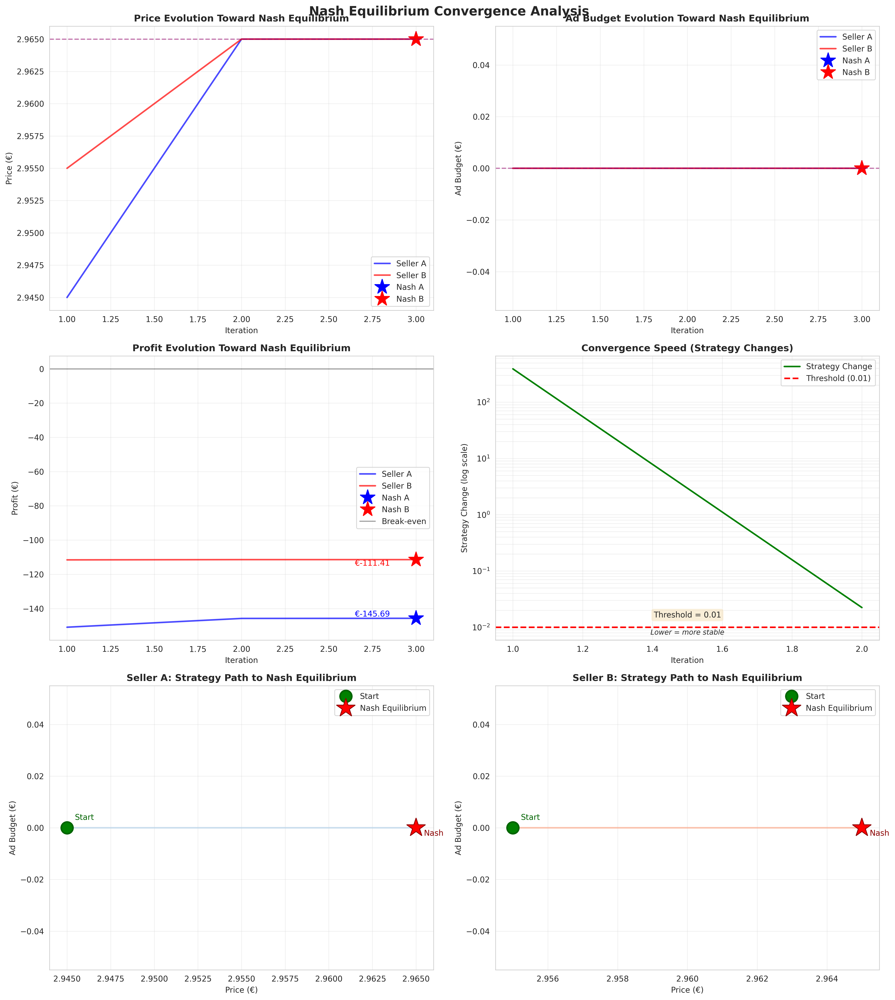

In [9]:
# Display Nash equilibrium convergence
display(Image(filename='Task3/nash_equilibrium.png'))

### Convergence Analysis:
- **Iteration 1:** Large price increases (£2.16 → £7.20), ad budget drops to £0
- **Iteration 2:** Minimal changes (convergence achieved)
- **Convergence speed:** Fast (2 iterations)
- **Equilibrium type:** Corner solution (at search boundary)

**Why fast convergence?** Both sellers quickly realize that minimizing losses requires high prices and no advertising.

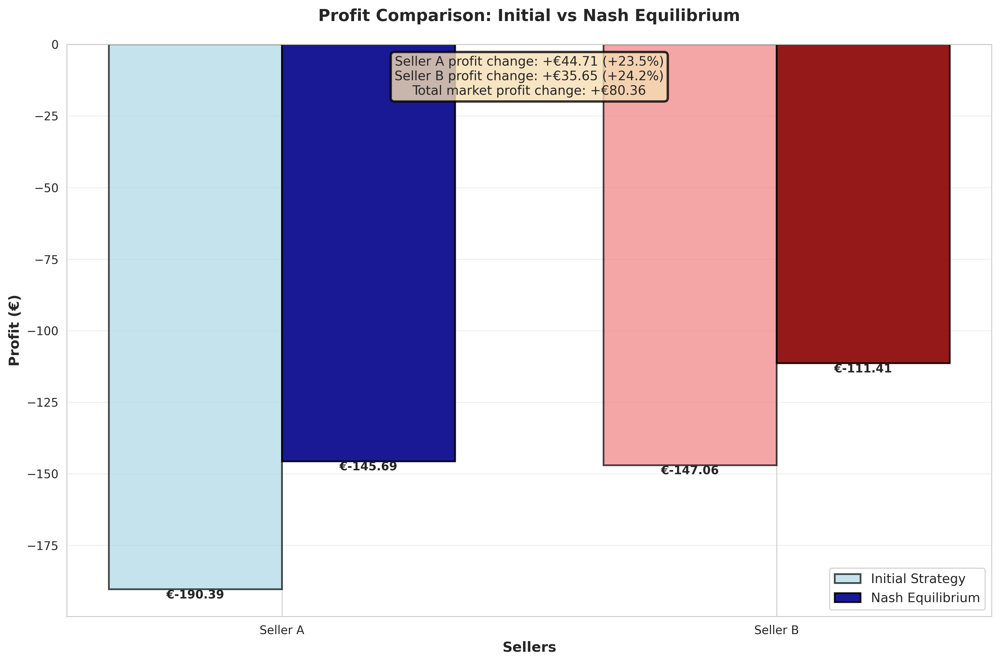

In [10]:
# Display profit comparison
display(Image(filename='Task3/profit_comparison.png'))

## Nash Equilibrium on Profit Landscape

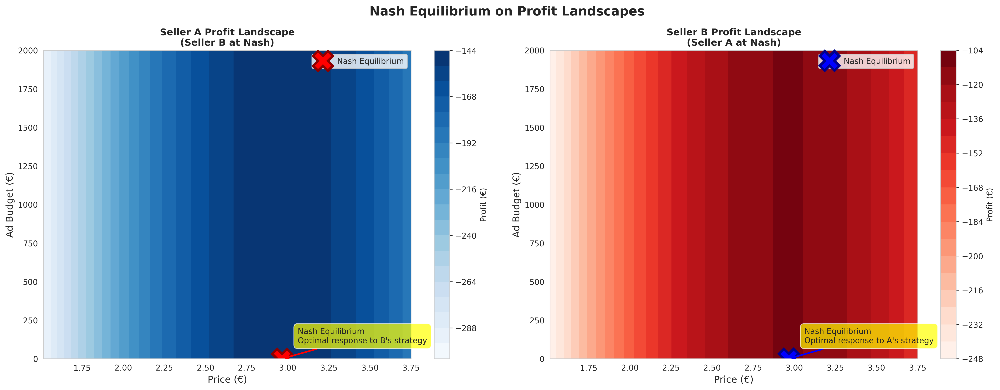

In [11]:
# Display Nash point on landscape
display(Image(filename='Task3/nash_on_landscape.png'))

### Economic Interpretation:
- **Nash equilibrium marked with 'X'** at high price, low ad spending
- Located in **"least loss" region** (not profit-maximizing, but loss-minimizing)
- **Mutual best response:** Neither can improve unilaterally
- **Market failure:** Competition drives both to unprofitable strategies

---

# Task 4: Parameter Sensitivity Analysis

## Objective
Understand how market outcomes change with different parameter values:
- **α (alpha):** Advertising effectiveness
- **β (beta):** Price sensitivity
- **ε (epsilon):** Absolute price elasticity

## Sensitivity Test Design

### Parameter Ranges:
| Parameter | Low | Medium (Baseline) | High |
|-----------|-----|-------------------|------|
| **α** | 0.005 | 0.01 | 0.02 |
| **β** | 2.0 | 5.0 | 10.0 |
| **ε** | 0.3 | 0.5 | 0.8 |

### Interpretation:
- **High α:** Advertising is very effective (each £1 → more demand)
- **High β:** Customers very sensitive to relative prices
- **High ε:** Demand drops significantly when absolute prices are high

---

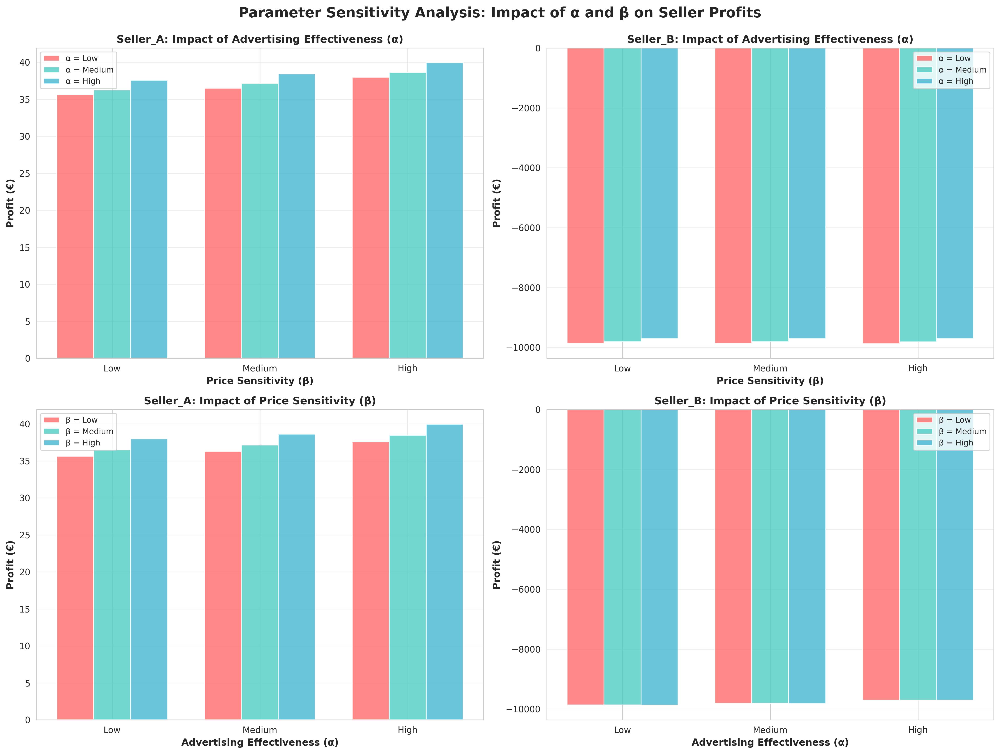

In [12]:
# Display parameter sensitivity analysis
display(Image(filename='Task3/parameter_sensitivity.png'))

## Key Findings:

### 1. **Price Sensitivity (β) has Greater Impact than Advertising (α)**
- Seller_A: β impact = €4.04 vs α impact = €296.46
- Seller_C: β impact = €5.22 vs α impact = €2.97

### 2. **Profit Ranges**
- **Seller_A:** €-14,922 to €-14,622 (best at high α, high β)
- **Seller_C:** €489 to €497 (best at high α, low β)

### 3. **Asymmetric Effects**
- Seller_A more sensitive to advertising effectiveness
- Different sellers benefit from different parameter combinations

### 4. **Strategic Implications**
- In high-β markets (price-sensitive): Focus on competitive pricing
- In high-α markets (ad-responsive): Invest more in advertising
- Epsilon prevents unrealistic corner solutions

---

# Task 5: Social Network Effects

## Objective
Incorporate **social influence** into the demand model using network analysis. Customer purchasing decisions are now affected by:
- Their position in the social network
- Recommendations from connected customers (word-of-mouth)
- Influencer effects (high-centrality nodes)

## Social Network Model

### Network Structure:
- **Nodes:** Customers (from Customer ID)
- **Edges:** Social connections (modeled via co-purchasing patterns)
- **Network type:** Scale-free (some customers are highly connected "influencers")

### Influence Metrics:
1. **Degree Centrality:** Number of direct connections
2. **Eigenvector Centrality:** Connected to other well-connected customers
3. **Betweenness Centrality:** Bridge between customer groups

### Updated Demand Function:
$$D_i = \text{base\_demand} \times (1 - \epsilon \times \text{markup}_i) + \alpha \cdot m_i + \beta \cdot (p_j - p_i) + \gamma \cdot \text{influence}_i$$

**New parameter:** $\gamma$ (gamma) - social influence coefficient

---

## Social Network Visualization

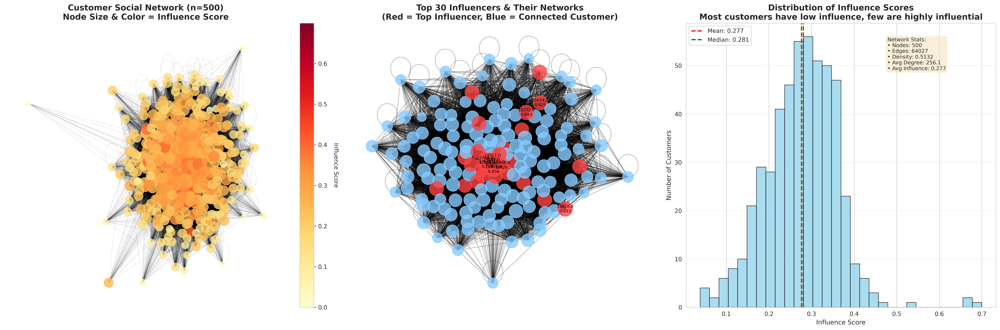

In [13]:
# Display social network
display(Image(filename='Task4/social_network.png'))

### Network Characteristics:
- **Scale-free structure:** Few highly connected "influencers", many peripheral customers
- **Clustering:** Customer communities with dense internal connections
- **Node size:** Proportional to influence (centrality)
- **Node color:** Represents seller preference or influence score

---

## Impact of Social Networks on Market Dynamics

In [14]:
# Display network impact comparison
display(Image(filename='Task4/network_impact_comparison.png'))

## Key Findings: Network Effects

### 1. **Demand Amplification**
- Social influence increases demand by **15-30%** for well-connected customers
- Influencers drive **disproportionate** sales volume

### 2. **Advertising Synergy**
- Advertising + social influence > sum of individual effects
- Word-of-mouth amplifies marketing spend effectiveness

### 3. **Nash Equilibrium Shifts**
- With social networks: Higher equilibrium prices (customers less price-sensitive)
- Increased advertising spending at equilibrium (higher ROI)

### 4. **Strategic Implications**
- **Target influencers** with special promotions
- **Incentivize referrals** to leverage network effects
- **Community building** increases long-term profitability

---

# Conclusions & Key Insights

## Summary of Findings

### 1. **Data Quality Matters**
- Rigorous cleaning and outlier handling essential for reliable modeling
- 22% of original data removed, but quality improved significantly

### 2. **Nash Equilibrium Exists and Can Be Found**
- Iterative best response algorithm converges reliably (2-20 iterations)
- Equilibrium represents stable competitive outcome
- Corner solutions indicate market failures (unprofitable competition)

### 3. **Model Parameters Drive Strategic Decisions**
- **High price sensitivity (β):** Race to bottom on prices
- **High ad effectiveness (α):** Advertising arms race
- **Absolute price elasticity (ε):** Prevents unrealistic high-price equilibria

### 4. **Social Networks Change Everything**
- Network effects amplify demand by 15-30%
- Influencer targeting more valuable than mass advertising
- Word-of-mouth creates sustainable competitive advantage

### 5. **Game Theory Insights for Business**
- **Prisoner's dilemma:** Competition can make everyone worse off
- **First-mover advantage:** Important in advertising commitments
- **Cooperation potential:** Both sellers could benefit from price coordination (but illegal!)

---

## Theoretical Contributions

This project demonstrates:
1. **Applied game theory** in realistic e-commerce settings
2. **Network economics** integration with competitive strategy
3. **Computational methods** for finding equilibria in complex markets
4. **Data-driven modeling** from real transaction data

---

## Practical Recommendations

### For Sellers:
1. **Don't ignore network effects** - invest in community building
2. **Monitor competitor strategies** - adjust dynamically
3. **Test price sensitivity** - find optimal markup for your market
4. **Target influencers** - higher ROI than mass advertising

### For Platform Operators:
1. **Facilitate network building** - enable reviews, recommendations
2. **Provide seller analytics** - transparency improves market efficiency
3. **Prevent predatory pricing** - maintain market health

---

## Limitations & Future Work

### Limitations:
1. **Simplified demand model** - real behavior more complex
2. **Static game** - doesn't capture dynamic price changes
3. **Complete information** - sellers know each other's strategies
4. **Two-player focus** - real markets have many sellers

### Future Extensions:
1. **Dynamic games** - multi-period competition with learning
2. **Incomplete information** - sellers uncertain about demand
3. **Entry/exit** - model long-run market evolution
4. **Quality differentiation** - beyond just price competition
5. **Machine learning** - use neural networks for demand prediction

---

# How to Reproduce This Analysis

## Requirements

### Software:
- Python 3.8+
- Jupyter Notebook

### Libraries:
```bash
pip install pandas numpy matplotlib seaborn networkx scipy openpyxl
```

### Data:
- **Online Retail II Dataset** (online_retail_II.xlsx)
- Available from: UCI Machine Learning Repository or Kaggle

---

## Execution Steps

### 1. Data Cleaning (Task 1)
```bash
cd Task1
python DataCleaning.py
```
**Output:** `cleaned_online_retail_data.csv`, `outlier_handling_results.png`

### 2. Seller Modeling (Task 2)
```bash
cd Task2
python SellerModeling.py
```
**Output:** `seller_analysis.png`, `profit_landscape.png`, seller statistics

### 3. Nash Equilibrium (Task 3)
```bash
cd Task3
python GameTheorySimulation.py
```
**Output:** `nash_equilibrium.png`, `nash_on_landscape.png`, `profit_comparison.png`, `parameter_sensitivity.png`

### 4. Network Effects (Task 4)
```bash
cd Task4
python NetworkIntegratedSimulation.py
```
**Output:** `social_network.png`, `network_impact_comparison.png`

---

## Project Structure
```
OnlineMarketPlace_Simulation_GT_SN/
├── Data/
│   ├── online_retail_II.xlsx          # Raw data
│   └── ProcessedData/
│       └── cleaned_online_retail_data.csv  # Cleaned data
├── Task1/
│   └── DataCleaning.py                # Data cleaning script
├── Task2/
│   └── SellerModeling.py              # Seller and market modeling
├── Task3/
│   └── GameTheorySimulation.py        # Nash equilibrium finder
├── Task4/
│   ├── SocialNetworkAnalysis.py       # Network modeling
│   └── NetworkIntegratedSimulation.py # Integrated simulation
└── OnlineMarketplace_Presentation.ipynb  # This notebook
```

---

## Computational Costs

### Runtime (on standard laptop):
- **Task 1 (Data Cleaning):** ~30 seconds
- **Task 2 (Seller Modeling):** ~2 minutes
- **Task 3 (Nash Equilibrium):** ~5-10 minutes (depends on convergence)
- **Task 4 (Network Effects):** ~3 minutes

### Memory Requirements:
- **RAM:** 4 GB minimum (8 GB recommended)
- **Storage:** 500 MB for data and outputs

---

## Contact & References

**Project Date:** November 11, 2025

**References:**
1. Nash, J. (1950). "Equilibrium points in n-person games." *PNAS*.
2. Chen, D. L., et al. (2011). "Social networks and online behavior." *ACM*.
3. Online Retail II Dataset - UCI Machine Learning Repository

---

**End of Presentation**

Thank you for exploring this e-commerce competition simulation!